# Using Neural Networks in Darts Models to Compare Different ML Algorithms to Predict Wind Speed and Direction.

This is a continuation from the [EDA findings](https://github.com/tosmartak/darts-model-for-wind-speed-direction-prediction/blob/push-files/notebooks/EDA.ipynb).

In [ ]:
!pip install -q darts;

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 693.9/693.9 kB 38.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 87.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 150.0/150.0 kB 22.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.0/719.0 kB 67.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 572.6/572.6 kB 61.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.6/76.6 MB 12.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.5/114.5 kB 18.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.0/100.0 kB 15.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.2/519.2 kB 37.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.4/46.4 kB 5.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
%matplotlib inline 

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import os
from datetime import datetime
import time

from darts import TimeSeries
from darts.utils.missing_values import fill_missing_values
from darts.metrics import rmse, mae, r2_score
from darts.models import CatBoostModel, LinearRegressionModel, RandomForest, LightGBMModel, XGBModel, NBEATSModel, BlockRNNModel, TFTModel, TransformerModel, TCNModel, RNNModel
from darts.dataprocessing.transformers import Scaler, MissingValuesFiller
from sklearn.preprocessing import MinMaxScaler
from darts.explainability import ShapExplainer, ExplainabilityResult

plt.rcParams["figure.figsize"] = (20, 5)

In [ ]:
# Select columns to use
use_col = ['Timestamp', 'GHI', 'DNI', 'DHI', 'ModA', 'ModB', 'Tamb', 'RH', 'WSgust', 'BP', 'Precipitation', 'TModA', 'TModB', 'WS', 'WD']

# load Bauchi data
path = '/content/drive/MyDrive/DS-ML projects/Predicting Wind Direction and Speed/data/solar-measurements_nigeria-bauchi_qc.csv'
df = pd.read_csv(path, skiprows=[1], encoding='unicode_escape', usecols = use_col, parse_dates = ['Timestamp'], index_col = 'Timestamp')
df = df.replace("NAN", np.nan)
# drop the last row
df = df.drop(df.index[-1])

In [ ]:
# Define function to calculate circular mean of wind direction
def circ_mean(x):
    x = np.radians(x)
    x_cos = np.mean(np.cos(x))
    x_sin = np.mean(np.sin(x))
    x_mean = np.arctan2(x_sin, x_cos)
    x_mean = np.degrees(x_mean) % 360
    return x_mean

# # CALCULATE WIND DIRECTION AVERAGE (by Kanda) https://gist.github.com/jmquintana79/dbca875cbe0c08154c8eca670e74fddf
# def circ_mean(D0:'np array') -> float:
#     """
#     Calculate wind direction average.
#     D0 -- list of angles to be averaged.
#     return -- average.
#     """
#     import numpy as np

#     ph = D0/180*np.pi
#     Ds = np.sin(ph)
#     Dc = np.cos(ph)

#     wd0 = 180/np.pi*np.arctan2(Ds.mean(),Dc.mean())
#     if wd0 < 0:            
#         wd0 += 360
#     mean_wd = wd0
#     return mean_wd

# Resample df to 1-hour intervals, calculating mean of selected column
df_hourly = df.resample('1H').agg({'GHI': ['mean'],
                                   'DNI': ['mean'],
                                   'DHI': ['mean'],
                                   'ModA': ['mean'],
                                   'ModB': ['mean'],
                                   'Tamb': ['mean'],
                                   'RH': ['mean'],
                                   'WSgust': ['mean'],
                                   'BP': ['mean'],
                                   'Precipitation': 'sum',
                                   'TModA': ['mean'],
                                   'TModB': ['mean'],
                                   'WS': ['mean'],
                                   'WD': circ_mean})

# Flatten column headers for df_hourly
df_hourly.columns = [f'{col[0]}_{col[1].upper()}' for col in df_hourly.columns]

# Based on our EDA findings, engineer features for hour and month
df_hourly["hour"] = df_hourly.index.hour
df_hourly["month"] = df_hourly.index.month

# reset index
df_hourly.reset_index(inplace=True)

# Round the float columns to 1 decimal place in df_hourly
float_cols = df_hourly.select_dtypes(include='float').columns
df_hourly[float_cols] = df_hourly[float_cols].round(1)

# Set Timestamp column as index and rename it
df_hourly = df_hourly.set_index('Timestamp')

# View the first 5 rows of df_hourly
df_hourly.head()

,GHI_MEAN,DNI_MEAN,DHI_MEAN,ModA_MEAN,ModB_MEAN,Tamb_MEAN,RH_MEAN,WSgust_MEAN,BP_MEAN,Precipitation_SUM,TModA_MEAN,TModB_MEAN,WS_MEAN,WD_CIRC_MEAN,hour,month
Timestamp,,,,,,,,,,,,,,,,
2021-09-20 00:00:00,-1.0,-0.2,-1.2,0.0,0.0,22.2,93.8,0.5,947.5,0.0,21.5,21.8,0.3,314.6,0,9
2021-09-20 01:00:00,-0.9,-0.2,-1.2,0.0,0.0,22.4,92.9,0.7,947.0,0.0,21.8,22.2,0.4,287.2,1,9
2021-09-20 02:00:00,-1.4,-0.4,-1.6,0.0,0.0,21.6,93.9,0.5,946.3,0.0,20.3,20.6,0.3,304.1,2,9
2021-09-20 03:00:00,-1.8,-0.4,-2.0,0.0,0.0,20.6,96.2,0.8,945.7,0.0,19.5,19.9,0.5,276.1,3,9
2021-09-20 04:00:00,-1.9,-0.4,-2.1,0.0,0.0,20.9,95.4,1.1,945.6,0.0,19.9,20.1,0.7,255.7,4,9


In [ ]:
# Define function to display forecast
def display_forecast(prediction_series, transformed_series, model_name, start_date=None):
    if start_date:
        transformed_series = transformed_series.drop_before(start_date)
    transformed_series.univariate_component(0).plot(label="Actual Values")
    prediction_series.plot(label="Predicted Values")
    rmse_value = rmse(transformed_series.univariate_component(0), prediction_series)
    mae_value = mae(transformed_series.univariate_component(0), prediction_series)
    plt.title(
        (model_name + "\n" + "RMSE: {:.2f}, \nMAE: {:.2f}".format(rmse_value, mae_value))
    )
    plt.legend(bbox_to_anchor=(1.12, 1), loc='upper right')
    return rmse_value, mae_value

# Define a function to fill in missing values using linear interpolation and scale the data
def transform_series(data_series, filler, scaler):
  filler = filler
  scaler = scaler
  transformed_series = scaler.fit_transform(filler.transform(data_series)).astype(np.float32)
  return scaler, transformed_series

# Define function to split series by date
def split_data(transformed_series, date_split=None, chart_title=None):
  train_ts, val_ts = transformed_series.split_after(pd.Timestamp(date_split))
  return train_ts, val_ts

# Define function to split series by date
def split_cov(transformed_series, date_split=None):
  train_ts, val_ts = transformed_series.split_after(pd.Timestamp(date_split))
  return train_ts, val_ts

# define function to evaluate any model only
def eval_model(model, series, pred_after, past_cov=None, model_name=None, target_desc=None, chart_title=None, clip_min=None, clip_max=None, summary_df=None):

  # log start time
  start_time = time.time()
  
  # Generate Predictions
  predictions = model.historical_forecasts(series, start=pd.Timestamp(pred_after), retrain=False, past_covariates = past_cov)

  # Clip predictions
  predictions = TimeSeries.from_times_and_values(predictions.time_index, np.clip(predictions.values(), clip_min, clip_max))

  # log end time
  end_time = time.time()

  # calculate elapsed time
  elapsed_time = end_time - start_time

  # display forecast and evaluation
  rmse, mae = display_forecast(predictions, series, chart_title, start_date=pd.Timestamp(pred_after))

  # Create summary dataframe
  summary = pd.DataFrame({'Model Name': [model_name],
                          'Target': [target_desc],
                          'RMSE': [rmse],
                          'MAE': [mae],
                          'Elapsed Time(s)': [elapsed_time]})
  
  # If summary_df already exists, append new row, else create summary_df
  summary_df = pd.concat([summary_df, summary], ignore_index=True)
  
  return model, summary_df

In [ ]:
# Converting Wind Speed Max to Timeseries Object
# since we have our timestamp already as index, we won't use time_col in our .from_dataframe()
ts_WS = TimeSeries.from_dataframe(df_hourly, value_cols= ['WS_MEAN'], freq='H')

# Converting Wind Direction to Timeseries Object
# since we have our timestamp already as index, we won't use time_col in our .from_dataframe()
ts_WD = TimeSeries.from_dataframe(df_hourly, value_cols= ['WD_CIRC_MEAN'], freq='H')

# Define post prediction date for model
pred_after = "20220801"


# transform WS Series
# WS_Scaler, transformed_WS_Series = transform_series(data_series=ts_WS, filler = MissingValuesFiller(), scaler = Scaler())

# Split into training and validation and plot
train_WS_ts, val_WS_ts = split_data(ts_WS, date_split = pred_after, chart_title="Wind Speed Split")

# Calculate the percentage of validation data
pct_val = len(val_WS_ts) / len(ts_WS) * 100
print(f"Percentage of validation data: {pct_val:.2f}%")


# transform WD Series
# WD_Scaler, transformed_WD_Series = transform_series(data_series=ts_WD, filler = MissingValuesFiller(), scaler = Scaler())

# Split into training and validation and plot
train_WD_ts, val_WD_ts = split_data(ts_WD, date_split = pred_after, chart_title="Wind Direction Split")

# Calculate the percentage of validation data
pct_val = len(val_WD_ts) / len(ts_WD) * 100
print(f"Percentage of validation data: {pct_val:.2f}%")


# Converting wind speed covariates to Timeseries Object
ts_cov_ws = TimeSeries.from_dataframe(df_hourly.drop(['WS_MEAN'], axis=1), freq='H')

# transform Wind Speed Covariates
WS_cov_scaler, ts_cov_ws = transform_series(data_series=ts_cov_ws, filler = MissingValuesFiller(), scaler = Scaler())

# Split Wind Speed Covariates
train_ws_cov, val_ws_cov = split_cov(ts_cov_ws, date_split=pred_after)


# Converting wind direction covariates to Timeseries Object
ts_cov_wd = TimeSeries.from_dataframe(df_hourly.drop(['WD_CIRC_MEAN'], axis=1), freq='H')

# transform Wind Direction Covariates
WD_cov_scaler, ts_cov_wd = transform_series(data_series=ts_cov_wd, filler = MissingValuesFiller(), scaler = Scaler())

# Split Wind Direction Covariates
train_wd_cov, val_wd_cov = split_cov(ts_cov_wd, date_split=pred_after)

Percentage of validation data: 13.69%
Percentage of validation data: 13.69%


In [ ]:
# Initialize the table to append our evaluation results as we fit each model
model_results = pd.DataFrame(columns=[])

# Define inputs for the model
input_len=12
output_len=1
layers=2
epochs=100

In [ ]:
# from pytorch_lightning.callbacks import EarlyStopping
# from torchmetrics import MeanSquaredError

# # any TorchMetric or val_loss can be used as the monitor
# torch_metrics = MeanSquaredError()

# # early stop callback
# my_stopper = EarlyStopping(
#     monitor="val_MeanSquaredError",  # "val_loss",
#     patience=5,
#     min_delta=0.05,
#     mode='min',
# )
# pl_trainer_kwargs = {"callbacks": [my_stopper]}

## Block Recurrent Neural Network

Streaming output truncated to the last 5000 lines.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU availa

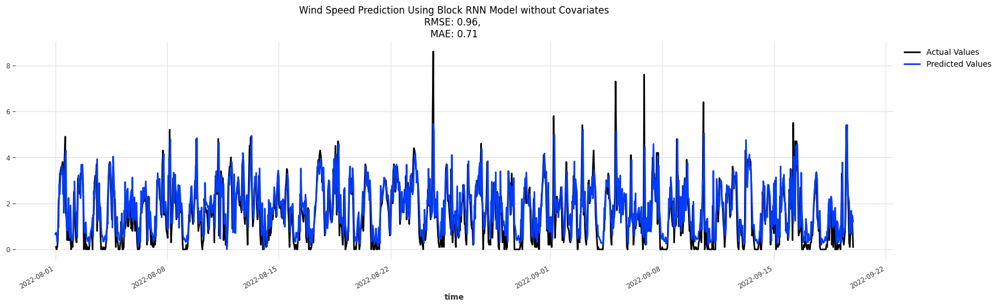

In [ ]:
brnn_ws_nocov = BlockRNNModel(input_chunk_length=input_len, output_chunk_length=output_len, n_rnn_layers=layers)

brnn_ws_nocov.fit(series=train_WS_ts, val_series=val_WS_ts, epochs=epochs, verbose=False)

brnn_ws_nocov_model, model_results = eval_model(brnn_ws_nocov, ts_WS, pred_after, 
                                                model_name = "Block RNN Model without Covariates", target_desc = "Wind Speed",
                                                chart_title = "Wind Speed Prediction Using Block RNN Model without Covariates",
                                                clip_min = 0, summary_df = model_results)

Streaming output truncated to the last 5000 lines.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU availa

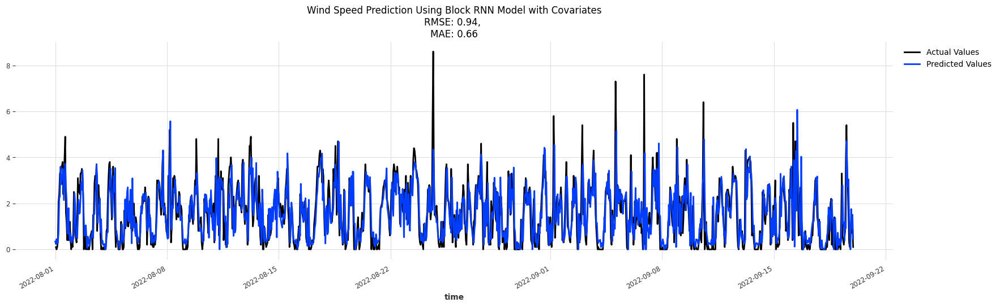

In [ ]:
brnn_ws_cov = BlockRNNModel(input_chunk_length=input_len, output_chunk_length=output_len, n_rnn_layers=layers)

brnn_ws_cov.fit(train_WS_ts, past_covariates=ts_cov_ws, epochs=epochs, verbose=False)

brnn_ws_cov_model, model_results = eval_model(brnn_ws_cov, ts_WS, pred_after, past_cov=ts_cov_ws,
                                              model_name = "Block RNN Model with Covariates", target_desc = "Wind Speed",
                                              chart_title = "Wind Speed Prediction Using Block RNN Model with Covariates",
                                              clip_min = 0, summary_df = model_results)

Streaming output truncated to the last 5000 lines.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU availa

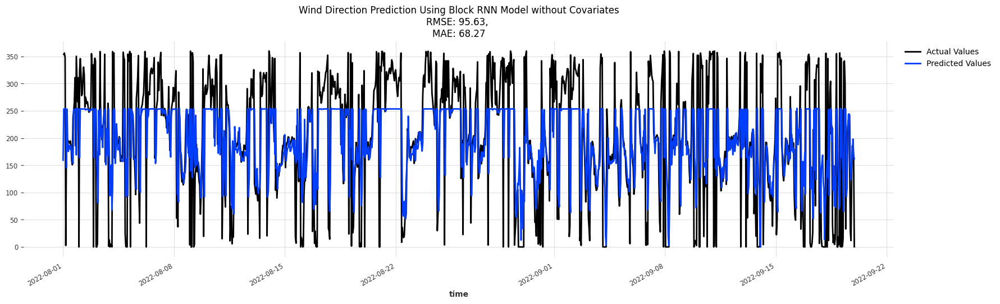

In [ ]:
brnn_WD_nocov = BlockRNNModel(input_chunk_length=input_len, output_chunk_length=output_len, n_rnn_layers=layers)

brnn_WD_nocov.fit(train_WD_ts, epochs=epochs, verbose=False)

brnn_WD_nocov_model, model_results = eval_model(brnn_WD_nocov, ts_WD, pred_after, 
                                                model_name = "Block RNN Model without Covariates", target_desc = "Wind Direction",
                                                chart_title = "Wind Direction Prediction Using Block RNN Model without Covariates",
                                                clip_min = 0, clip_max = 360, summary_df = model_results)

Streaming output truncated to the last 5000 lines.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU availa

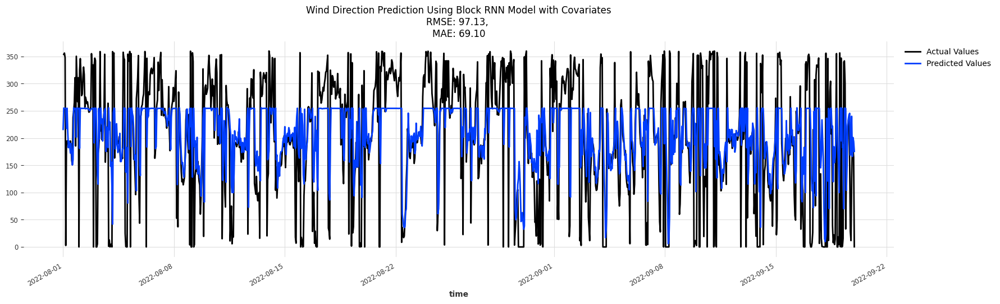

In [ ]:
brnn_WD_cov = BlockRNNModel(input_chunk_length=input_len, output_chunk_length=output_len, n_rnn_layers=layers)

brnn_WD_cov.fit(series=train_WD_ts, past_covariates=ts_cov_wd, epochs=epochs, verbose=False)

brnn_WD_cov_model, model_results = eval_model(brnn_WD_cov, ts_WD, pred_after, past_cov=ts_cov_wd,
                                              model_name = "Block RNN Model with Covariates", target_desc = "Wind Direction",
                                              chart_title = "Wind Direction Prediction Using Block RNN Model with Covariates",
                                              clip_min = 0, clip_max = 360, summary_df = model_results)

## Neural Basis Expansion Analysis Time Series Forecasting (N-BEATS)

Streaming output truncated to the last 5000 lines.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU availa

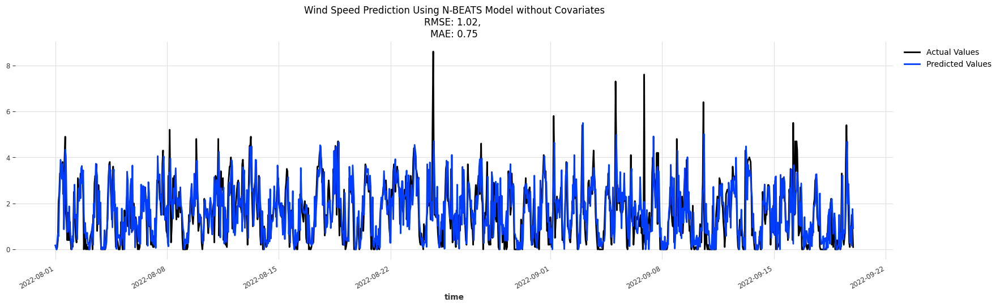

In [ ]:
nbeats_ws_nocov = NBEATSModel(input_chunk_length=input_len, output_chunk_length=output_len, num_layers=layers)

nbeats_ws_nocov.fit(train_WS_ts, epochs=epochs, verbose=False)

nbeats_ws_nocov_model, model_results = eval_model(nbeats_ws_nocov, ts_WS, pred_after,
                                                  model_name = "N-BEATS Model without Covariates", target_desc = "Wind Speed",
                                                  chart_title = "Wind Speed Prediction Using N-BEATS Model without Covariates",
                                                  clip_min = 0, summary_df = model_results)

Streaming output truncated to the last 5000 lines.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU availa

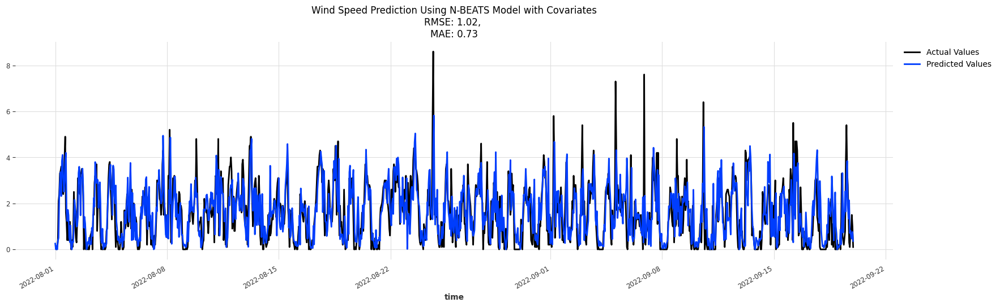

In [ ]:
nbeats_ws_cov = NBEATSModel(input_chunk_length=input_len, output_chunk_length=output_len, num_layers=layers)

nbeats_ws_cov.fit(train_WS_ts, past_covariates=ts_cov_ws, epochs=epochs, verbose=False)

nbeats_ws_cov_model, model_results = eval_model(nbeats_ws_cov, ts_WS, pred_after, past_cov=ts_cov_ws,
                                                model_name = "N-BEATS Model with Covariates", target_desc = "Wind Speed",
                                                chart_title = "Wind Speed Prediction Using N-BEATS Model with Covariates",
                                                clip_min = 0, summary_df = model_results)

Streaming output truncated to the last 5000 lines.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU availa

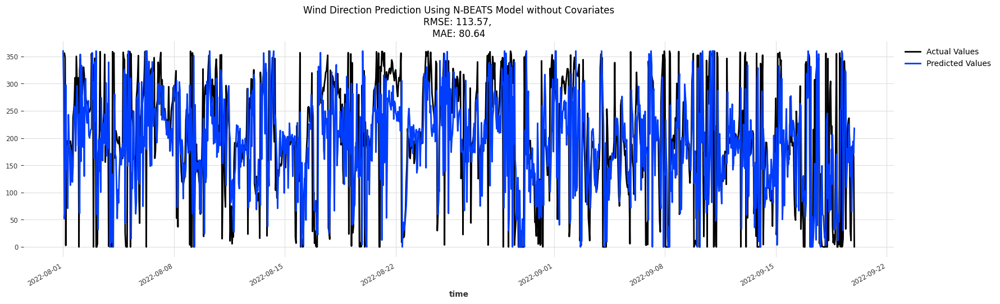

In [ ]:
nbeats_WD_nocov = NBEATSModel(input_chunk_length=input_len, output_chunk_length=output_len, num_layers=layers)

nbeats_WD_nocov.fit(train_WD_ts, epochs=epochs, verbose=False)

nbeats_WD_nocov_model, model_results = eval_model(nbeats_WD_nocov, ts_WD, pred_after, 
                                                  model_name = "N-BEATS Model without Covariates", target_desc = "Wind Direction",
                                                  chart_title = "Wind Direction Prediction Using N-BEATS Model without Covariates",
                                                  clip_min = 0, clip_max = 360, summary_df = model_results)

In [ ]:
nbeats_WD_cov = NBEATSModel(input_chunk_length=input_len, output_chunk_length=output_len, num_layers=layers)

nbeats_WD_cov.fit(train_WD_ts, past_covariates=ts_cov_wd, epochs=epochs, verbose=False)

nbeats_WD_cov_model, model_results = eval_model(nbeats_WD_cov, ts_WD, pred_after, past_cov=ts_cov_wd,
                                                model_name = "N-BEATS Model with Covariates", target_desc = "Wind Direction",
                                                chart_title = "Wind Direction Prediction Using N-BEATS Model with Covariates",
                                                clip_min = 0, clip_max = 360, summary_df = model_results)

## Temporal Fusion Transformer

Streaming output truncated to the last 5000 lines.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU availa

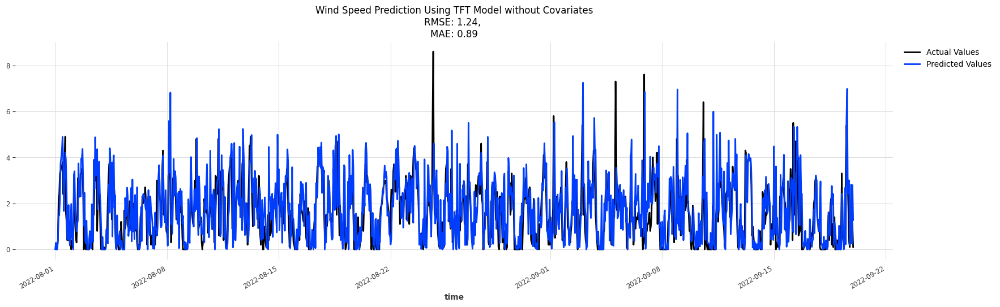

In [ ]:
tft_ws_nocov = TFTModel(input_chunk_length=input_len, output_chunk_length=output_len, add_relative_index=True, lstm_layers=layers)

tft_ws_nocov.fit(train_WS_ts, future_covariates=None, epochs=epochs, verbose=False)

tft_ws_nocov_model, model_results = eval_model(tft_ws_nocov, ts_WS, pred_after,
                                                  model_name = "TFT Model without Covariates", target_desc = "Wind Speed",
                                                  chart_title = "Wind Speed Prediction Using TFT Model without Covariates",
                                                  clip_min = 0, summary_df = model_results)

Streaming output truncated to the last 5000 lines.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU availa

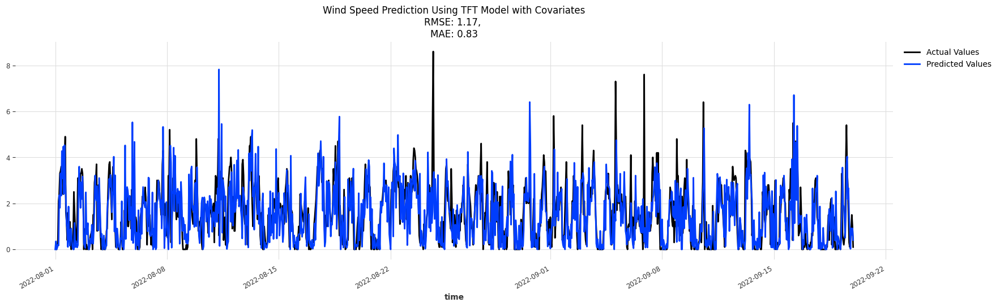

In [ ]:
tft_ws_cov = TFTModel(input_chunk_length=input_len, output_chunk_length=output_len, add_relative_index=True, lstm_layers=layers)

tft_ws_cov.fit(train_WS_ts, past_covariates=ts_cov_ws, epochs=epochs, verbose=False)

tft_ws_cov_model, model_results = eval_model(tft_ws_cov, ts_WS, pred_after, past_cov=ts_cov_ws,
                                                model_name = "TFT Model with Covariates", target_desc = "Wind Speed",
                                                chart_title = "Wind Speed Prediction Using TFT Model with Covariates",
                                                clip_min = 0, summary_df = model_results)

Streaming output truncated to the last 5000 lines.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU availa

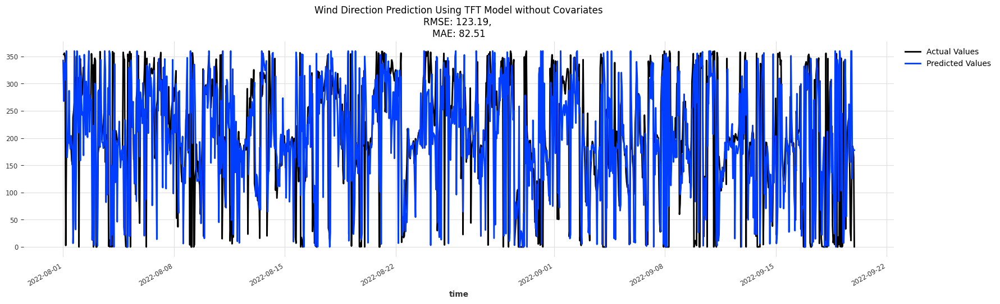

In [ ]:
tft_WD_nocov = TFTModel(input_chunk_length=input_len, output_chunk_length=output_len, add_relative_index=True, lstm_layers=layers)

tft_WD_nocov.fit(train_WD_ts, epochs=epochs, verbose=False)

tft_WD_nocov_model, model_results = eval_model(tft_WD_nocov, ts_WD, pred_after, 
                                                  model_name = "TFT Model without Covariates", target_desc = "Wind Direction",
                                                  chart_title = "Wind Direction Prediction Using TFT Model without Covariates",
                                                  clip_min = 0, clip_max = 360, summary_df = model_results)

Streaming output truncated to the last 5000 lines.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU availa

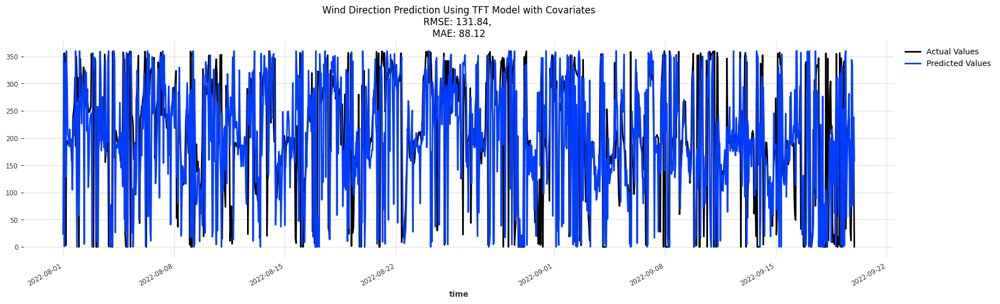

In [ ]:
tft_WD_cov = TFTModel(input_chunk_length=input_len, output_chunk_length=output_len, add_relative_index=True, lstm_layers=layers)

tft_WD_cov.fit(train_WD_ts, past_covariates=ts_cov_wd, epochs=epochs, verbose=False)

tft_WD_cov_model, model_results = eval_model(tft_WD_cov, ts_WD, pred_after, past_cov=ts_cov_wd,
                                                model_name = "TFT Model with Covariates", target_desc = "Wind Direction",
                                                chart_title = "Wind Direction Prediction Using TFT Model with Covariates",
                                                clip_min = 0, clip_max = 360, summary_df = model_results)

## Temporal Convolutional Network (TCN)

Streaming output truncated to the last 5000 lines.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU availa

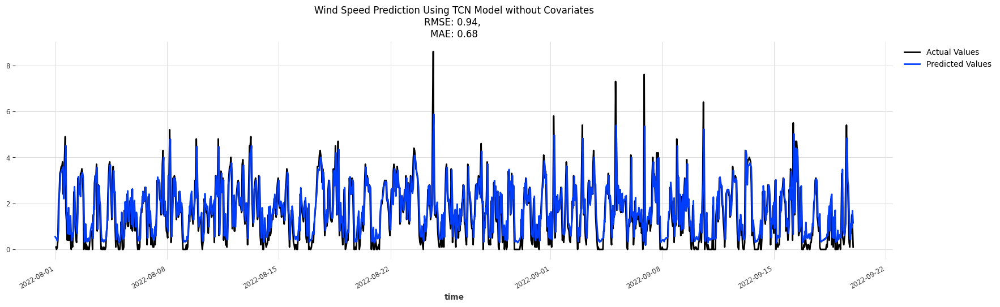

In [ ]:
tcn_ws_nocov = TCNModel(input_chunk_length=input_len, output_chunk_length=output_len, num_layers=layers)

tcn_ws_nocov.fit(train_WS_ts, epochs=epochs, verbose=False)

tcn_ws_nocov_model, model_results = eval_model(tcn_ws_nocov, ts_WS, pred_after,
                                                  model_name = "TCN Model without Covariates", target_desc = "Wind Speed",
                                                  chart_title = "Wind Speed Prediction Using TCN Model without Covariates",
                                                  clip_min = 0, summary_df = model_results)

Streaming output truncated to the last 5000 lines.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU availa

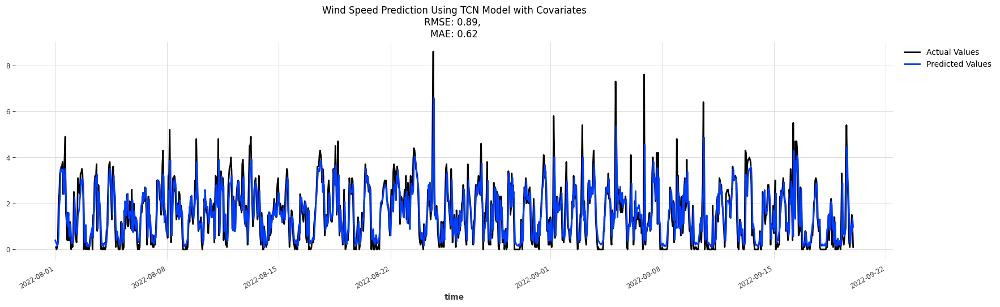

In [ ]:
tcn_ws_cov = TCNModel(input_chunk_length=input_len, output_chunk_length=output_len, num_layers=layers)

tcn_ws_cov.fit(train_WS_ts, past_covariates=ts_cov_ws, epochs=epochs, verbose=False)

tcn_ws_cov_model, model_results = eval_model(tcn_ws_cov, ts_WS, pred_after, past_cov=ts_cov_ws,
                                              model_name = "TCN Model with Covariates", target_desc = "Wind Speed",
                                                chart_title = "Wind Speed Prediction Using TCN Model with Covariates",
                                                clip_min = 0, summary_df = model_results)

Streaming output truncated to the last 5000 lines.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU availa

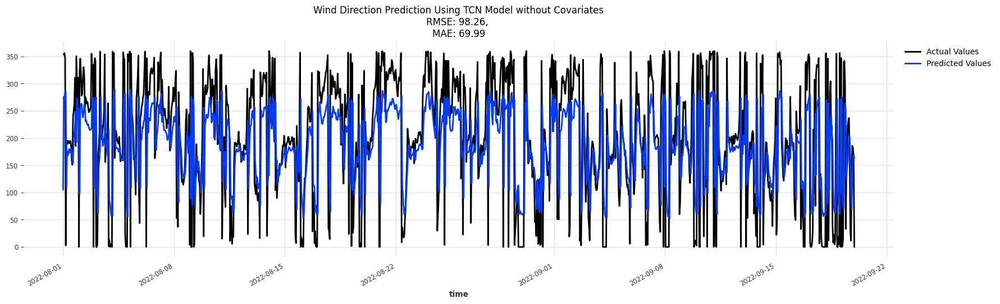

In [ ]:
tcn_WD_nocov = TCNModel(input_chunk_length=input_len, output_chunk_length=output_len, num_layers=layers)

tcn_WD_nocov.fit(train_WD_ts, epochs=epochs, verbose=False)

tcn_WD_nocov_model, model_results = eval_model(tcn_WD_nocov, ts_WD, pred_after, 
                                                  model_name = "TCN Model without Covariates", target_desc = "Wind Direction",
                                                  chart_title = "Wind Direction Prediction Using TCN Model without Covariates",
                                                  clip_min = 0, clip_max = 360, summary_df = model_results)

Streaming output truncated to the last 5000 lines.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU availa

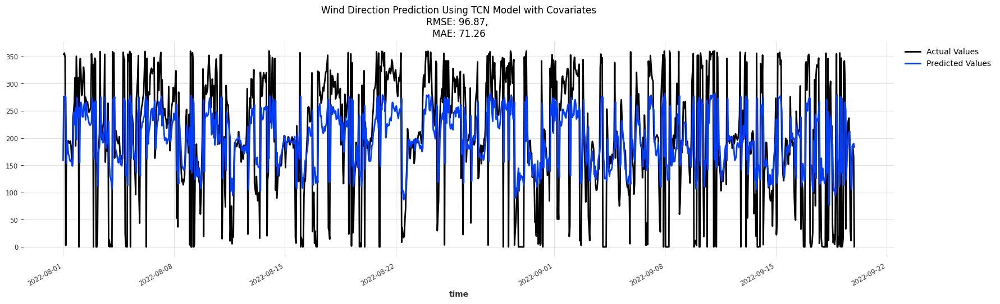

In [ ]:
tcn_WD_cov = TCNModel(input_chunk_length=input_len, output_chunk_length=output_len, num_layers=layers)

tcn_WD_cov.fit(train_WD_ts, past_covariates=ts_cov_wd, epochs=epochs, verbose=False)

tcn_WD_cov_model, model_results = eval_model(tcn_WD_cov, ts_WD, pred_after, past_cov=ts_cov_wd,
                                                model_name = "TCN Model with Covariates", target_desc = "Wind Direction",
                                                chart_title = "Wind Direction Prediction Using TCN Model with Covariates",
                                                clip_min = 0, clip_max = 360, summary_df = model_results)

## Transformer Model

Streaming output truncated to the last 5000 lines.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU availa

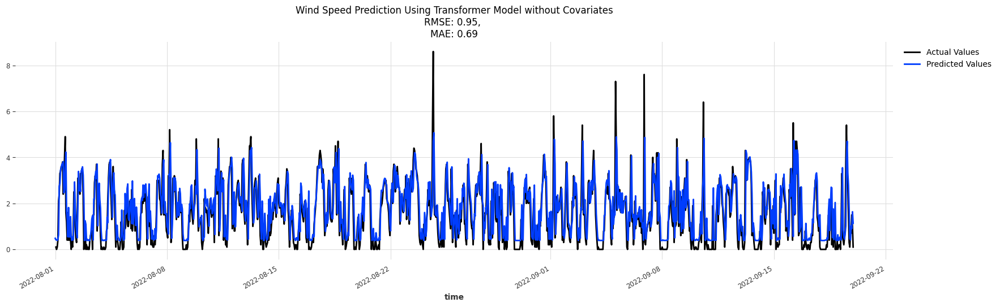

In [ ]:
transformer_ws_nocov = TransformerModel(input_chunk_length=input_len, output_chunk_length=output_len)

transformer_ws_nocov.fit(train_WS_ts, epochs=epochs, verbose=False)

transformer_ws_nocov_model, model_results = eval_model(transformer_ws_nocov, ts_WS, pred_after,
                                                  model_name = "Transformer Model without Covariates", target_desc = "Wind Speed",
                                                  chart_title = "Wind Speed Prediction Using Transformer Model without Covariates",
                                                  clip_min = 0, summary_df = model_results)

Streaming output truncated to the last 5000 lines.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU availa

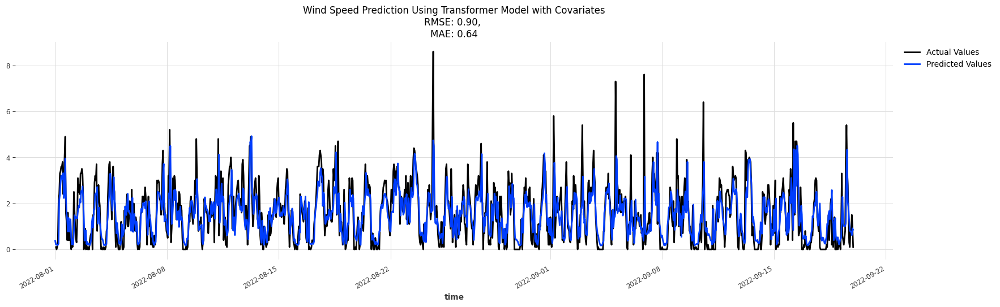

In [ ]:
transformer_ws_cov = TransformerModel(input_chunk_length=input_len, output_chunk_length=output_len)

transformer_ws_cov.fit(train_WS_ts, past_covariates=ts_cov_ws, epochs=epochs, verbose=False)

transformer_ws_cov_model, model_results = eval_model(transformer_ws_cov, ts_WS, pred_after, past_cov=ts_cov_ws,
                                              model_name = "Transformer Model with Covariates", target_desc = "Wind Speed",
                                                chart_title = "Wind Speed Prediction Using Transformer Model with Covariates",
                                                clip_min = 0, summary_df = model_results)

Streaming output truncated to the last 5000 lines.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU availa

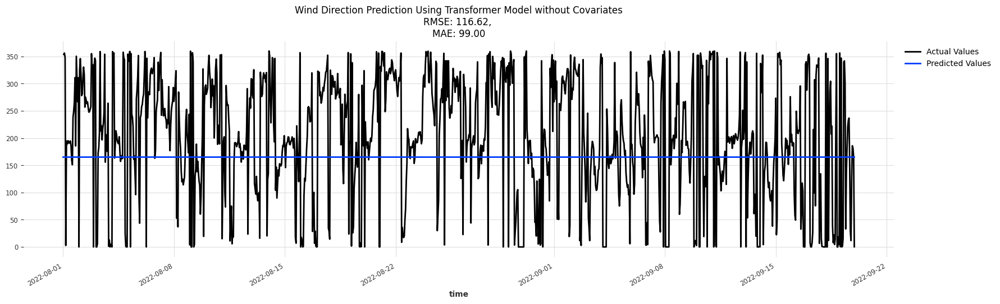

In [ ]:
transformer_WD_nocov = TransformerModel(input_chunk_length=input_len, output_chunk_length=output_len)

transformer_WD_nocov.fit(train_WD_ts, epochs=epochs, verbose=False)

transformer_WD_nocov_model, model_results = eval_model(transformer_WD_nocov, ts_WD, pred_after, 
                                                  model_name = "Transformer Model without Covariates", target_desc = "Wind Direction",
                                                  chart_title = "Wind Direction Prediction Using Transformer Model without Covariates",
                                                  clip_min = 0, clip_max = 360, summary_df = model_results)

Streaming output truncated to the last 5000 lines.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU availa

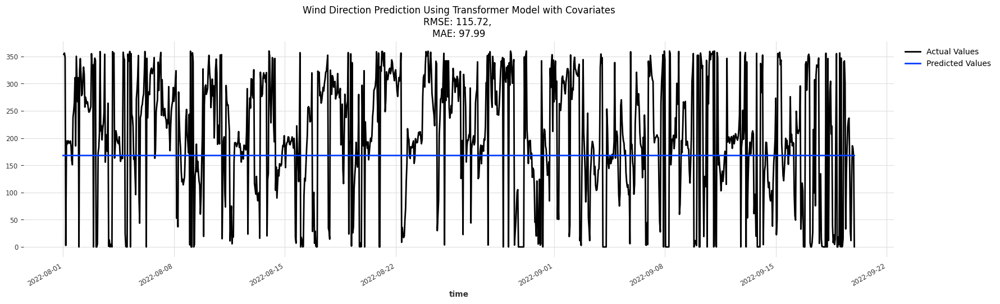

In [ ]:
transformer_WD_cov = TransformerModel(input_chunk_length=input_len, output_chunk_length=output_len)

transformer_WD_cov.fit(train_WD_ts, past_covariates=ts_cov_wd, epochs=epochs, verbose=False)

transformer_WD_cov_model, model_results = eval_model(transformer_WD_cov, ts_WD, pred_after, past_cov=ts_cov_wd,
                                                model_name = "Transformer Model with Covariates", target_desc = "Wind Direction",
                                                chart_title = "Wind Direction Prediction Using Transformer Model with Covariates",
                                                clip_min = 0, clip_max = 360, summary_df = model_results)

In [ ]:
model_results

,Model Name,Target,RMSE,MAE,Elapsed Time(s)
0,TCN Model without Covariates,Wind Speed,0.935584,0.675018,75.865520
1,TCN Model with Covariates,Wind Speed,0.889160,0.617617,76.482814
2,TCN Model without Covariates,Wind Direction,98.261669,69.994601,75.517994
3,TCN Model with Covariates,Wind Direction,96.872942,71.264985,75.892539
4,Transformer Model without Covariates,Wind Speed,0.952489,0.687088,97.169528
5,Transformer Model with Covariates,Wind Speed,0.895856,0.642234,97.168988
6,Transformer Model without Covariates,Wind Direction,116.617058,99.001431,97.473835
7,Transformer Model with Covariates,Wind Direction,115.718753,97.987215,101.692247
8,Block RNN Model without Covariates,Wind Speed,0.964987,0.712045,76.428574
9,Block RNN Model with Covariates,Wind Speed,0.935437,0.663642,79.089171


In [ ]:
def plot_model_results(model_results, Target, ax_title):
  # Filter for target
  model_results_ws = model_results[model_results['Target'] == Target]

  # Sort values by RMSE
  model_results_ws_sorted = model_results_ws.sort_values('RMSE', ascending=False)

  # Define columns to plot
  columns_to_plot = ['MAE', 'RMSE']

  # Set plot size
  fig, ax = plt.subplots(figsize=(8, 10))

  # Plot horizontal bar chart
  model_results_ws_sorted.plot(kind='barh', x='Model Name', y=columns_to_plot, ax=ax)

  # Set plot title and axis labels
  ax.set_title(ax_title)
  ax.set_xlabel('Error')
  ax.set_ylabel('Model Name')

  # Show plot
  plt.legend(bbox_to_anchor=(1.14, 1), loc='upper right')
  plt.show()

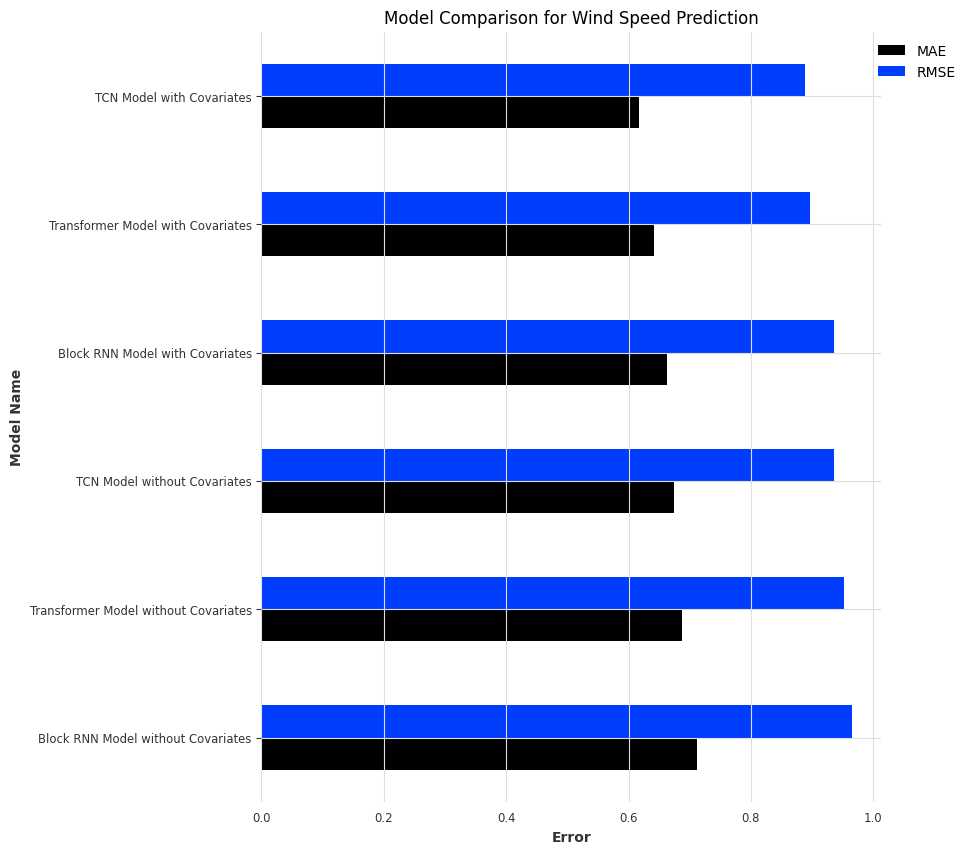

In [ ]:
plot_model_results(model_results, Target="Wind Speed", ax_title="Model Comparison for Wind Speed Prediction")

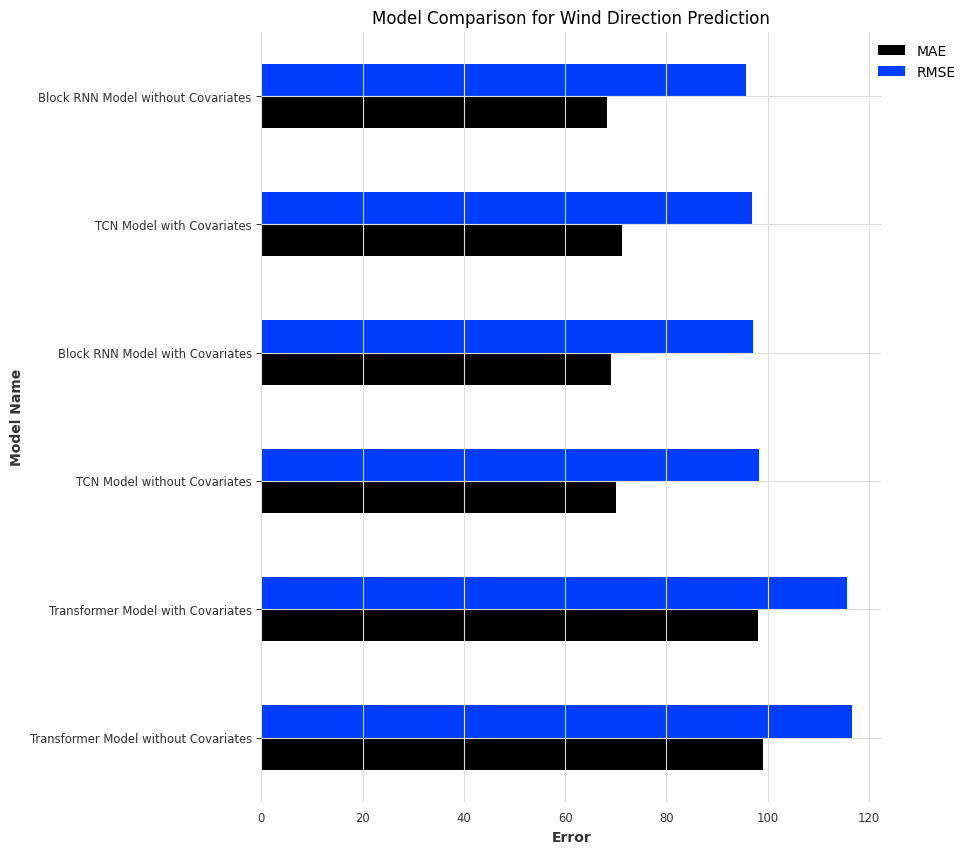

In [ ]:
plot_model_results(model_results, Target="Wind Direction", ax_title="Model Comparison for Wind Direction Prediction")

In [ ]:
def model_elapsed_time(model_results, Target, ax_title):
  # Filter for target
  model_results_ws = model_results[model_results['Target'] == Target]

  # Sort values by RMSE
  model_results_ws_sorted = model_results_ws.sort_values('Elapsed Time(s)', ascending = False)

  # Set plot size
  fig, ax = plt.subplots(figsize=(10, 5))

  # Plot horizontal bar chart
  model_results_ws_sorted.plot(kind='barh', x='Model Name', y='Elapsed Time(s)', ax=ax)

  # Set plot title and axis labels
  ax.set_title(ax_title)
  ax.set_xlabel('Elapsed Time(s)')
  ax.set_ylabel('Model Name')

  # Show plot
  plt.show()

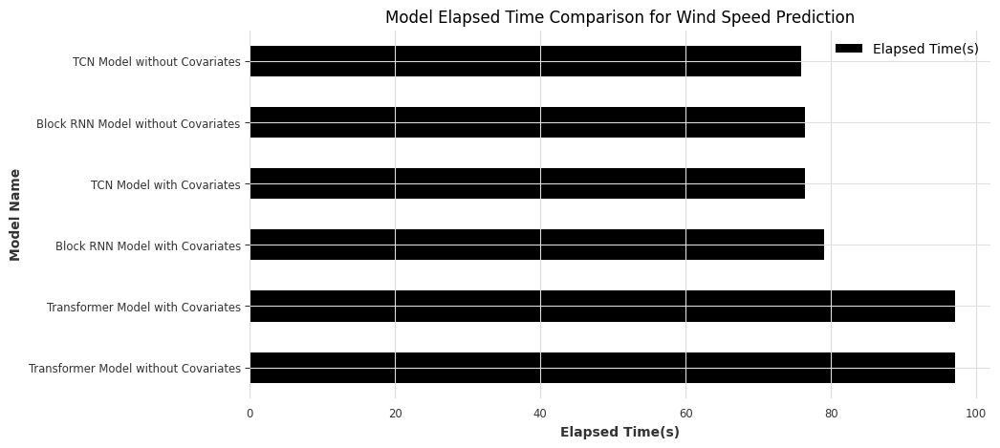

In [ ]:
model_elapsed_time(model_results, Target="Wind Speed", ax_title="Model Elapsed Time Comparison for Wind Speed Prediction")

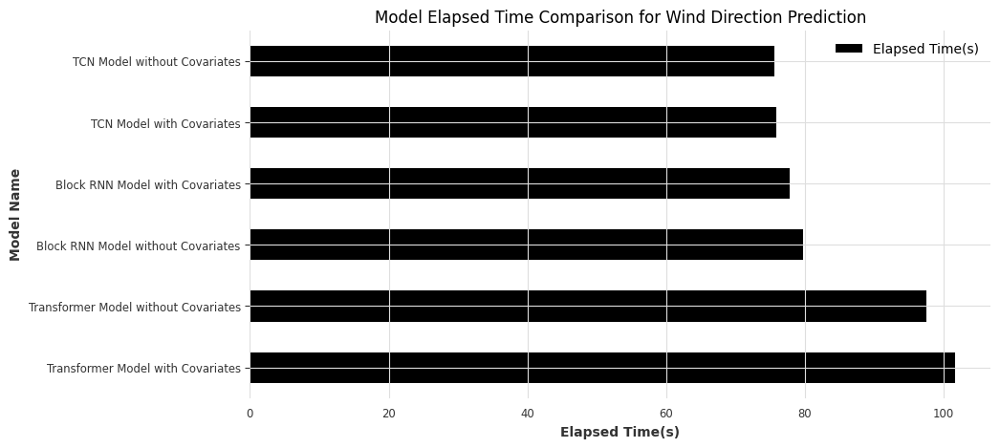

In [ ]:
model_elapsed_time(model_results, Target="Wind Direction", ax_title="Model Elapsed Time Comparison for Wind Direction Prediction")

In [ ]:
# Replace the path with desired path
path = '/content/drive/MyDrive/DS-ML projects/Predicting Wind Direction and Speed/data'

# Ensure the directory exists, create it if it doesn't
if not os.path.exists(path):
    os.makedirs(path)

model_results.to_csv(os.path.join(path,'model_results with neural networks.csv'), index=False)